# ECSE 415 Final Project: Detection and Localization (30 Points)

Group 10 

April 2022

In [1]:
import cv2
from google.colab import drive
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import os 
import random
import pickle

drive.mount('/content/drive')
path='/content/drive/My Drive/ecse 415/Assignment_2/the_office/'
path='/content/drive/My Drive/ecse415-project/'

Mounted at /content/drive


### Sliding Window

In [ ]:
class Patch():
    def __init__(self,x: float,
                 y: float,
                 w: float,
                 h: float):
        self.x = x
        self.y = y
        self.w = w
        self.h = h
    def __str__(self):
        return "x: {0}\ty: {1}\tw: {2}\th: {3}".format(self.x,self.y,self.w, self.h)


def sliding_window(img: np.ndarray, patch_size: float = 30, non_intersected_percentage: float = 0.5, custom_patch_sizes = []):
    """find all patches of a certain size
    
    Parameters
    ----------
    img : np.ndarray
        The image. 
    patch_size : float, optional
        The size of the patch
    non_intersected_percentage: float, optional
        a percentage of non intersected area between the patches
    custom_patch_sizes: [[width,height], [width,height]...] optional

    Returns
    -------
    list[Patch]
        a list of all the patches
    np.ndarray
        img with patches
    """
    copy = img.copy()
    max_width = img.shape[1]
    max_height = img.shape[0]
    patches = []

    if custom_patch_sizes:
      for i in custom_patch_sizes:    
        window_x = 0 # shape 0 size x size 
        window_y = 0
        width = i[0]
        height = i[1]
        color = [random.randint(0,255), random.randint(0,255), random.randint(0,255)]
        while int(window_y + height) < max_height:
          while int(window_x + width) < max_width:
            patch = Patch(window_x,window_y,width,height)
            cv2.rectangle(copy, (window_x,window_y), (window_x+width,window_y+height), color, 2)
            patches.append(patch)
            window_x = int(window_x + width * (non_intersected_percentage))
          window_y = int(window_y + height * (non_intersected_percentage))
          window_x = 0;
      return patches, copy

    # if custom_patch_sizes is empty:
    width = patch_size
    height = patch_size
    color = [0, 0, 51]
    for i in range(3):
      window_x = 0 # shape 0 size x size 
      window_y = 0
      if(i == 1): # shape 1 (size * 0.5) x (size * 1.5)
        width = int(patch_size/2)
        height = int(patch_size + patch_size/2)
        color = [51, 51, 204]

      if(i == 2): # shape 2 (size * 1.5) x (size * 0.5) 
        width = int(patch_size + patch_size/2)
        height = int(patch_size/2)
        color = [166, 51, 204]
        
      while int(window_y + height) < max_height:
        while int(window_x + width) < max_width:
          patch = Patch(window_x,window_y,width,height)
          cv2.rectangle(copy, (window_x,window_y), (window_x+width,window_y+height), color, 2)
          patches.append(patch)
          window_x = int(window_x + width * (non_intersected_percentage))
        window_y = int(window_y + height * (non_intersected_percentage))
        window_x = 0;

    return patches, copy

### Image Pyramids

In [ ]:
import math
def see_many_images(images, num_images, w, h, number_col):
  # Partially taken from: https://stackoverflow.com/questions/46615554/how-to-display-multiple-images-in-one-figure-correctly
  # w=20
  # h=num_images/2
  fig=plt.figure(figsize = (w,h))

  for i in range(0,num_images):
    fig.add_subplot(math.ceil(num_images/number_col),number_col,i+1)
    plt.xticks([])
    plt.yticks([])
    #print(images[i].shape)
    plt.imshow(images[i])
    
  plt.show()

In [ ]:
PATCH_SIZE = (65, 110)

def image_pyramids(image, classifier, num_pyramids = 7, scale_param = 1.2, start_pyramids=0):
  """
  This function will use the given classifier on the image to detect where
  in the image vehicles appear.
  It will return a list of bounding boxes.
  It uses image pyramids.
  """
  
  original_image_shape = image.shape
  vehicle_patches = []    # the patches of the vehicles
  pyramid_matches = []    # Which pyramids were vehicles found
  resize_ratio = 1
  number_patches_tested = 0 
  copy = image.copy()
  cropped_images_pyramid = [[] for i in range(0, num_pyramids)]   # The cropped images in each pyramid that are tested through the classifier
  pyramids = []   # The pyramids with windows that will be labelled on to them.

  for p in range(0, num_pyramids):

    
    img = image.copy()
    img = cv2.resize(img, (int(img.shape[1] / resize_ratio), int(img.shape[0] / resize_ratio)), interpolation=cv2.INTER_AREA)
    pyramids.append(img)

    if p < start_pyramids:
      resize_ratio = resize_ratio * 1.2
      continue

    print("Pyramid ", p + 1, "- Image Shape: ", img.shape)

    for i in range(0, img.shape[1], PATCH_SIZE[1]):
      left_x = i
      right_x = i + PATCH_SIZE[1]
      for j in range(0, img.shape[0], PATCH_SIZE[0]):
        top_y = j
        bottom_y = j + PATCH_SIZE[0]

        cropped_image = img[top_y:bottom_y, left_x:right_x]
        cropped_images_pyramid[p].append(cropped_image)
        number_patches_tested += 1
        label = getLabelHOG(cropped_image, classifier)

        if label == 1:
          if int(right_x*resize_ratio) > original_image_shape[1] or int(bottom_y*resize_ratio) > original_image_shape[0]:
            continue
          vehicle_patches.append([int(left_x*resize_ratio), int(top_y*resize_ratio), int(right_x*resize_ratio), int(bottom_y*resize_ratio)])
          pyramid_matches.append(p)
        cv2.rectangle(pyramids[p], (left_x,top_y), (right_x, bottom_y), [238,75,43], 4)
      
    resize_ratio = resize_ratio * 1.2

  
  for patch in vehicle_patches:
    cv2.rectangle(copy, (patch[0],patch[1]), (patch[2], patch[3]), [238,75,43], 4)
  print("Number of patches tested ", number_patches_tested)
  print("Number of vehicles found ", len(pyramid_matches))

  return vehicle_patches, copy, cropped_images_pyramid, pyramids, pyramid_matches


In [ ]:
def image_pyramid_test(image, model, start_pyramids=5, num_pyramids=7):
  vehicle_patches, localized_image, cropped_images_pyramid, pyramids, pyramid_matches = image_pyramids(image, model, start_pyramids=start_pyramids, num_pyramids=num_pyramids)
  print("Vehicle Patches per image pyramid")
  print(np.bincount(np.array(pyramid_matches)))
  print("See image pyramids with potential patches drawn on")
  see_many_images(pyramids, 7, 10, 5, 2)
  print("LOCALIZED IMAGE")
  plt.imshow(localized_image)

In [ ]:
img0 = cv2.imread(path+'dataset_given/0000/000000.png', cv2.COLOR_BGR2RGB)
img9 = cv2.imread(path+'dataset_given/0003/000009.png', cv2.COLOR_BGR2RGB)
img20 = cv2.imread(path+'dataset_given/0003/000020.png', cv2.COLOR_BGR2RGB)
img143 = cv2.imread(path+'dataset_given/0003/000143.png', cv2.COLOR_BGR2RGB)
img75 = cv2.imread(path+'dataset_given/0003/000075.png', cv2.COLOR_BGR2RGB)
img90 = cv2.imread(path+'dataset_given/0003/000090.png', cv2.COLOR_BGR2RGB)
img50 = cv2.imread(path+'dataset_given/0003/000050.png', cv2.COLOR_BGR2RGB)

#### Tests

Pyramid  6 - Image Shape:  (150, 499, 3)
Pyramid  7 - Image Shape:  (125, 415, 3)
Number of patches tested  23
Number of vehicles found  1
Vehicle Patches per image pyramid
[0 0 0 0 0 1]
See image pyramids with potential patches drawn on


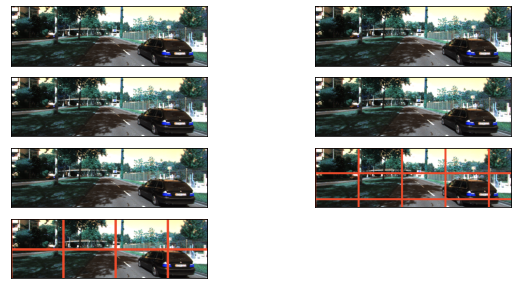

LOCALIZED IMAGE


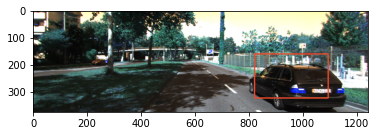

In [ ]:
image_pyramid_test(img9, model_svm_01, start_pyramids=5)

Pyramid  6 - Image Shape:  (150, 499, 3)
Pyramid  7 - Image Shape:  (125, 415, 3)
Number of patches tested  23
Number of vehicles found  5
Vehicle Patches per image pyramid
[0 0 0 0 0 4 1]
See image pyramids with potential patches drawn on


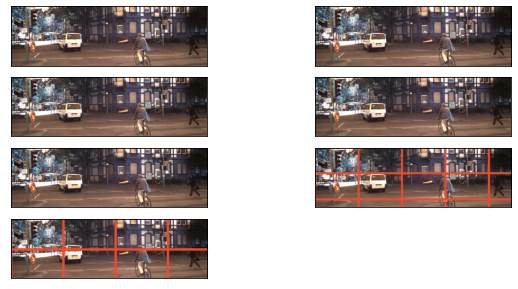

LOCALIZED IMAGE


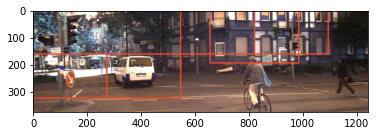

In [ ]:
image_pyramid_test(img0, model_svm_01, start_pyramids=5)

Pyramid  5 - Image Shape:  (180, 598, 3)
Pyramid  6 - Image Shape:  (150, 499, 3)
Pyramid  7 - Image Shape:  (125, 415, 3)
Number of patches tested  41
Number of vehicles found  4
Vehicle Patches per image pyramid
[0 0 0 0 3 1]
See image pyramids with potential patches drawn on


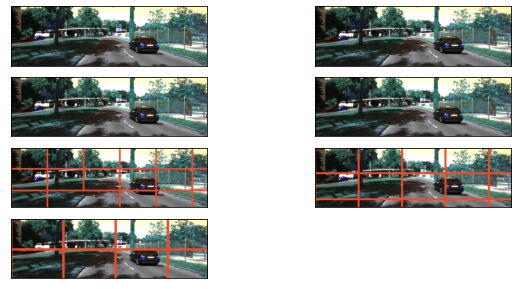

LOCALIZED IMAGE


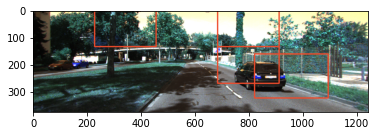

In [ ]:
image_pyramid_test(img20, model_svm_01, start_pyramids=4)

Pyramid  1 - Image Shape:  (375, 1242, 3)
Pyramid  2 - Image Shape:  (312, 1035, 3)
Pyramid  3 - Image Shape:  (260, 862, 3)
Pyramid  4 - Image Shape:  (217, 718, 3)
Pyramid  5 - Image Shape:  (180, 598, 3)
Pyramid  6 - Image Shape:  (150, 499, 3)
Pyramid  7 - Image Shape:  (125, 415, 3)
Number of patches tested  223
Number of vehicles found  16
Vehicle Patches per image pyramid
[4 4 3 4 0 1]
See image pyramids with potential patches drawn on


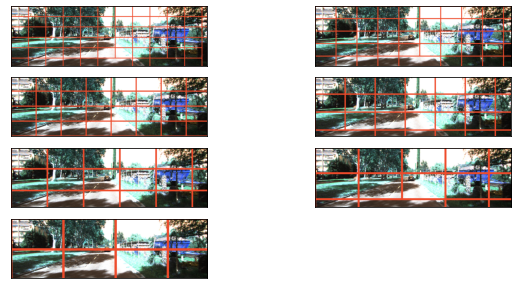

LOCALIZED IMAGE


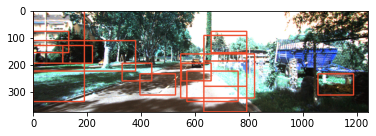

In [ ]:
image_pyramid_test(img143, model_svm_01, start_pyramids=0)

Pyramid  5 - Image Shape:  (180, 598, 3)
Pyramid  6 - Image Shape:  (150, 499, 3)
Pyramid  7 - Image Shape:  (125, 415, 3)
Number of patches tested  41
Number of vehicles found  5
Vehicle Patches per image pyramid
[0 0 0 0 3 2]
See image pyramids with potential patches drawn on


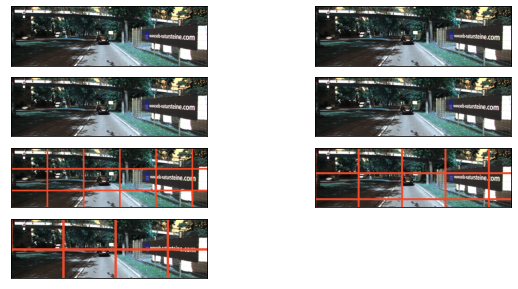

LOCALIZED IMAGE


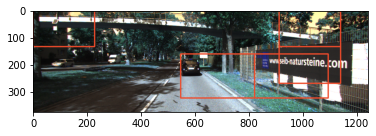

In [ ]:
image_pyramid_test(img75, model_svm_01, start_pyramids=4)

Pyramid  3 - Image Shape:  (260, 862, 3)
Pyramid  4 - Image Shape:  (217, 718, 3)
Pyramid  5 - Image Shape:  (180, 598, 3)
Pyramid  6 - Image Shape:  (150, 499, 3)
Pyramid  7 - Image Shape:  (125, 415, 3)
Number of patches tested  101
Number of vehicles found  8
Vehicle Patches per image pyramid
[0 0 5 1 1 1]
See image pyramids with potential patches drawn on


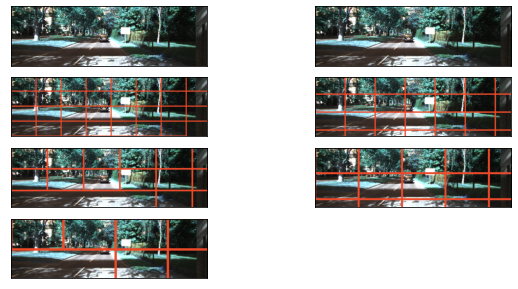

LOCALIZED IMAGE


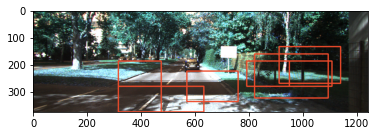

In [ ]:
image_pyramid_test(img90, model_svm_01, start_pyramids=2)

Pyramid  4 - Image Shape:  (217, 718, 3)
Pyramid  5 - Image Shape:  (180, 598, 3)
Pyramid  6 - Image Shape:  (150, 499, 3)
Pyramid  7 - Image Shape:  (125, 415, 3)
Number of patches tested  69
Number of vehicles found  5
Vehicle Patches per image pyramid
[0 0 0 3 1 1]
See image pyramids with potential patches drawn on


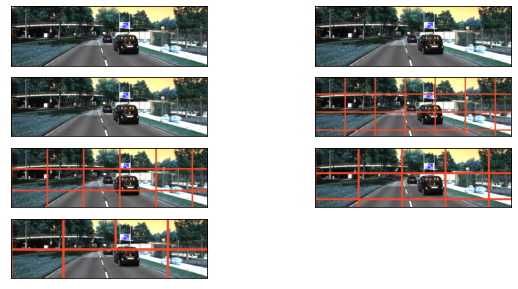

LOCALIZED IMAGE


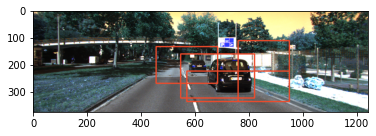

In [ ]:
image_pyramid_test(img50, model_svm_01, start_pyramids=3)

### HoG Classifier

In [ ]:
RESIZE_WIDTH = 110
RESIZE_HEIGHT = 72

# RESIZE_HEIGHT = 64
# RESIZE_WIDTH = 128

cell_size = (8, 8)  # h x w in pixels
block_size = (2, 2)  # h x w in cells
nbins = 9  # number of orientation bins

# winSize is the size of the image cropped to an multiple of the cell size
# cell_size is the size of the cells of the img patch over which to calculate the histograms
# block_size is the number of cells which fit in the patch
hog = cv2.HOGDescriptor(_winSize=(RESIZE_WIDTH // cell_size[1] * cell_size[1],
                                  RESIZE_HEIGHT // cell_size[0] * cell_size[0]),
                        _blockSize=(block_size[1] * cell_size[1],
                                    block_size[0] * cell_size[0]),
                        _blockStride=(cell_size[1], cell_size[0]),
                        _cellSize=(cell_size[1], cell_size[0]),
                        _nbins=nbins)


def getLabelHOG(image, model):
  # plt.imshow(image)
  img = image.copy()
  img = cv2.resize(image, (RESIZE_WIDTH, RESIZE_HEIGHT), interpolation=cv2.INTER_AREA)
  feat = hog.compute(img)
  feat = feat.astype(float).reshape(1, -1)
  prediction = model.predict(feat)
  # if prediction[0] == 1:
  #   plt.figure(figsize=(25,25))
  #   plt.subplot(131), plt.imshow(image)
  #   plt.title("detected")
  #   plt.show()
  return prediction

### Localizer

In [ ]:
data = ['car','truck','bike','nothing','road']

def check_patches_overlap(patches ,patch2: Patch):
    """find overlaps between an array of patches and a patch

    Parameters
    ----------
    patches : array of patches
    patch2 : Patch

    Returns
    -------
    boolean
      true if there's an overlap
      false if there is not
    """
    for patch1 in patches:
      if patch1.x >= patch2.x and patch1.x <= patch2.x + patch2.w:
        if patch1.y >= patch2.y and patch1.y <= patch2.y + patch2.h:
          return True
        if patch2.y >= patch1.y and patch2.y <= patch1.y + patch1.h:
          return True
      if patch2.x >= patch1.x and patch2.x < patch1.x + patch1.w:
          if patch1.y >= patch2.y and patch1.y <= patch2.y + patch2.h:
            return True
          if patch2.y >= patch1.y and patch2.y <= patch1.y + patch1.h:
            return True
    return False

def average(array):
    return int(sum(array) / len(array))


In [ ]:
def localize2(patches, img, model):

  labeled_patches = []
  copy = img.copy()
  #print(len(patches))
  for patch in patches:
    cropped_image= copy[patch.y:patch.y+patch.h, patch.x:patch.x+patch.w]
    label = getLabelHOG(cropped_image, model)
    if label[0] == 1:
      labeled_patches.append(patch)
  for patch in labeled_patches:
    cv2.rectangle(copy, (patch.x,patch.y), (patch.x + patch.w, patch.y+patch.h), [238,75,43], 4)
    #cv2.putText(copy, sorted_list[i][1], (grouped_patch.x, grouped_patch.y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)
  return labeled_patches, copy

In [ ]:
def new_NMS(patches, img):
  copy = img.copy()
  rectangles = sorted(patches, key=lambda r: r.x) # sorting based on x (Not sure if that's the best thing to do but we need a way to group them)
  grouped = []
  result = []
  
  for r in rectangles:
    duplicated = False
    # if grouped is empty or the patch don't overlap with the last patch in the last group or the first patch in the last group
    if not grouped:
      # print('solo patch')
      # print(r)
      grouped.append([r]) # append new group
    else:
      for g in grouped:
        if not duplicated and check_patches_overlap(g, r):
          # print("first",r)
          # print(check_patches_overlap(g, r))
          # print(duplicated)
          g.append(r)
          duplicated = True
      if not duplicated:
        grouped.append([r])

  # NON MAXIMUM SUPPRESSION
  for g in grouped: 
    if len(g) == 1:
      #print("K")
      result.append(g[0]) # solo patch
    else: ## non maximum suppression
      x = [] 
      y = [] 
      h = []
      w = []
      for element in g:
        #print('element',element)
        x.append(element.x)
        y.append(element.y)
        h.append(element.h)
        w.append(element.w)
      #print('''''''''''')
      # getting the smallest window (probably there are better ways to do this)
      # result.append(Patch(max(x),max(y), min(w), min(h)))
      result.append(Patch(min(x),min(y), max(x) + w[x.index(max(x))] - min(x), max(y) + h[y.index(max(y))] - min(y) ))
  #print(len(result))
  for patch in result:
    cv2.rectangle(copy, (patch.x,patch.y), (patch.x + patch.w, patch.y+patch.h), [238,75,43], 4)
  return result, copy


### Testing

In [ ]:
def test_localize(model, img):
  patches,img3 = sliding_window(img, non_intersected_percentage=.8, custom_patch_sizes=[[300,100],[220,130],[150,150]])
  #patches,img3 = sliding_window(img, non_intersected_percentage=1, custom_patch_sizes=[[128, 64], [256,124]])
  print("PATCHES")
  print("Number of patches: ", len(patches))
  #patches2,img4 = sliding_window(img, 100, 0.75)

  plt.figure(figsize=(25,25))
  plt.subplot(131), plt.imshow(img3)
  plt.title("Custom sizes")
  plt.show()
  # plt.figure(figsize=(25,25))
  # plt.subplot(131), plt.imshow(img4)
  # plt.title("One size")
  # plt.show()


  localized, localized_img = localize2(patches, img, model)
  
  boxes = []
  for i in localized:
    patch_cord = []
    patch_cord.append(i.x)
    patch_cord.append(i.y)
    patch_cord.append(i.w)
    patch_cord.append(i.h)
    boxes.append(patch_cord)
  box_grouped, _ = cv2.groupRectangles(boxes, 1, 1)
  copy = img.copy()
  p, grouped = new_NMS(localized, img)
  for rectangle in box_grouped:
    cv2.rectangle(copy, (rectangle[0],rectangle[1]), (rectangle[0]+ rectangle[2], rectangle[1]+ rectangle[3]), [238,75,43], 4)
  print('Patches detected: ', localized)
  print('Group Rectangles: ', box_grouped)
  plt.figure(figsize=(25,25))
  plt.subplot(131), plt.imshow(img)
  plt.title("Original")
  plt.show()
  plt.figure(figsize=(25,25))
  plt.subplot(131), plt.imshow(localized_img)
  plt.title("Localized")
  plt.show()
  plt.figure(figsize=(25,25))
  plt.subplot(131), plt.imshow(grouped)
  plt.title("NMS")
  plt.show()
  plt.figure(figsize=(25,25))
  plt.subplot(131), plt.imshow(copy)
  plt.title("Group Rectangles")
  plt.show()

In [ ]:
img0_0 = cv2.imread(path+'dataset_given/0000/000000.png', cv2.COLOR_BGR2RGB)
img0_5 = cv2.imread(path+'dataset_given/0000/000005.png', cv2.COLOR_BGR2RGB)
img0_10 = cv2.imread(path+'dataset_given/0000/000010.png', cv2.COLOR_BGR2RGB)

img1_9 = cv2.imread(path+'dataset_given/0001/000009.png', cv2.COLOR_BGR2RGB)
img1_20 = cv2.imread(path+'dataset_given/0001/000020.png', cv2.COLOR_BGR2RGB)
img1_50 = cv2.imread(path+'dataset_given/0001/000050.png', cv2.COLOR_BGR2RGB)

img2_100 = cv2.imread(path+'dataset_given/0002/000100.png', cv2.COLOR_BGR2RGB)
img2_150 = cv2.imread(path+'dataset_given/0002/000150.png', cv2.COLOR_BGR2RGB)
img2_160 = cv2.imread(path+'dataset_given/0002/000160.png', cv2.COLOR_BGR2RGB)

img3_1 = cv2.imread(path+'dataset_given/0003/000001.png', cv2.COLOR_BGR2RGB)
img3_2 = cv2.imread(path+'dataset_given/0003/000002.png', cv2.COLOR_BGR2RGB)
img3_3 = cv2.imread(path+'dataset_given/0003/000003.png', cv2.COLOR_BGR2RGB)

In [ ]:
# MODELS

model_path = path + "models/SVM_rbf_train01.pkl"
model_svm_01 =  pickle.load(open(model_path, 'rb'))

model_path = path + "models/SVM_rbf_train02.pkl"
model_svm_02 =  pickle.load(open(model_path, 'rb'))

model_path = path + "models/SVM_rbf_train12.pkl"
model_svm_12 =  pickle.load(open(model_path, 'rb'))

#### Testing Runs

##### Dataset: 0000

PATCHES
Number of patches:  54


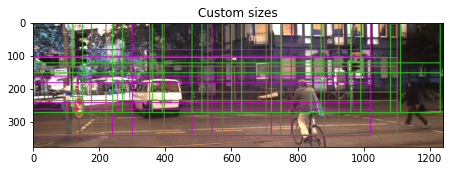

Patches detected:  [<__main__.Patch object at 0x7f9ccb00b050>, <__main__.Patch object at 0x7f9ccb00b1d0>, <__main__.Patch object at 0x7f9ccb00b2d0>, <__main__.Patch object at 0x7f9ccb00b750>, <__main__.Patch object at 0x7f9ccb00be50>, <__main__.Patch object at 0x7f9ccb00bb90>, <__main__.Patch object at 0x7f9ccb00bd10>, <__main__.Patch object at 0x7f9ccb2b6ed0>, <__main__.Patch object at 0x7f9ccaffb590>]
Group Rectangles:  [[773  53 273 110]
 [  0 184 260 115]]


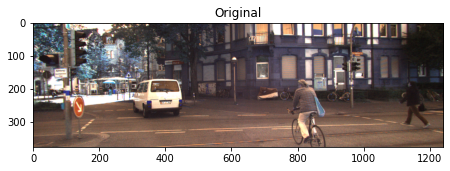

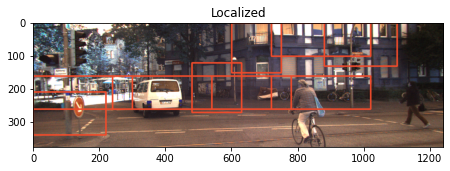

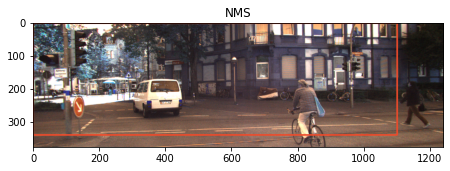

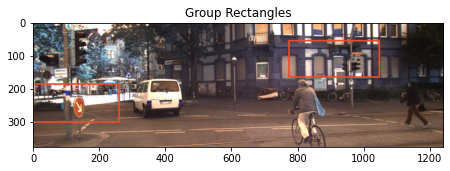

In [ ]:
test_localize(model_svm_12, img0_0)

PATCHES
Number of patches:  54


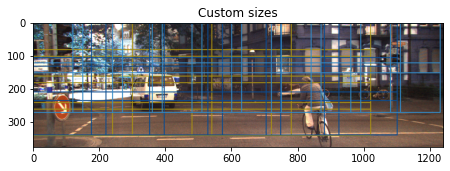

Patches detected:  [<__main__.Patch object at 0x7f9ccb2b6210>, <__main__.Patch object at 0x7f9ccb2b6390>, <__main__.Patch object at 0x7f9ccb2b6590>, <__main__.Patch object at 0x7f9ccaffbc90>, <__main__.Patch object at 0x7f9ccb30afd0>, <__main__.Patch object at 0x7f9ccb365750>, <__main__.Patch object at 0x7f9ccb365790>, <__main__.Patch object at 0x7f9ccb2e6250>]
Group Rectangles:  [[808  37 238 122]]


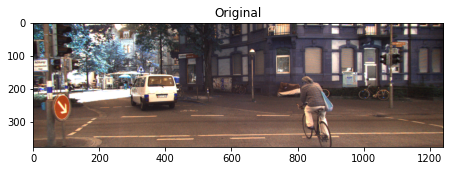

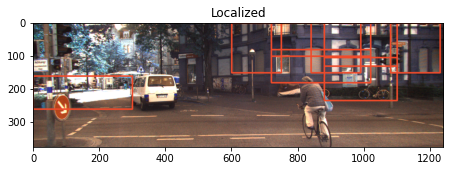

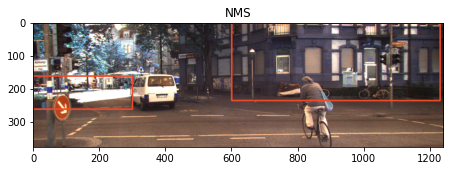

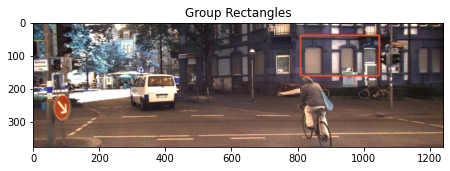

In [ ]:
test_localize(model_svm_12, img0_5)

PATCHES
Number of patches:  54


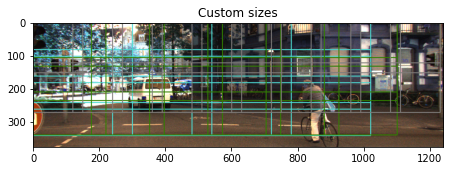

Patches detected:  [<__main__.Patch object at 0x7f9ccb17b110>, <__main__.Patch object at 0x7f9ccb1d2890>, <__main__.Patch object at 0x7f9ccb17b890>, <__main__.Patch object at 0x7f9ccb28e550>, <__main__.Patch object at 0x7f9ccb28ef90>, <__main__.Patch object at 0x7f9ccb28e790>, <__main__.Patch object at 0x7f9ccb28e810>, <__main__.Patch object at 0x7f9ccb28edd0>, <__main__.Patch object at 0x7f9ccb28eb50>]
Group Rectangles:  [[864  40 198 135]]


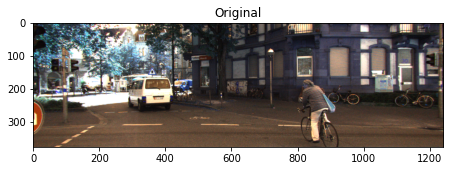

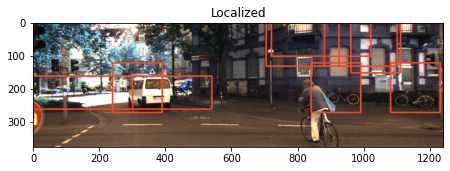

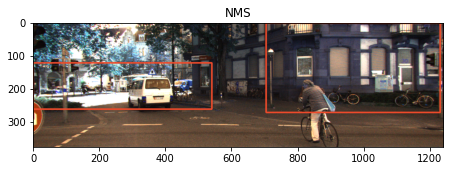

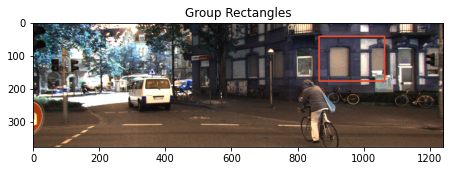

In [ ]:
test_localize(model_svm_12, img0_10)

##### Dataset: 0001

PATCHES
Number of patches:  54


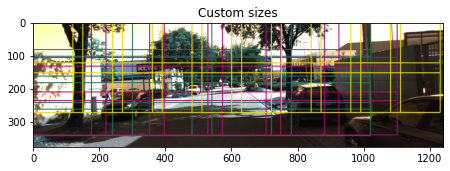

Patches detected:  [<__main__.Patch object at 0x7f9cdb9e4850>, <__main__.Patch object at 0x7f9ccaf6bd10>, <__main__.Patch object at 0x7f9ccaf6ba50>, <__main__.Patch object at 0x7f9ccaf6b210>, <__main__.Patch object at 0x7f9ccaf6b190>, <__main__.Patch object at 0x7f9ccaf6be10>, <__main__.Patch object at 0x7f9ccb2478d0>, <__main__.Patch object at 0x7f9ccb247e50>, <__main__.Patch object at 0x7f9ccb247990>, <__main__.Patch object at 0x7f9ccb247490>, <__main__.Patch object at 0x7f9ccb247150>, <__main__.Patch object at 0x7f9ccb1daf10>, <__main__.Patch object at 0x7f9ccb1da790>]
Group Rectangles:  [[741  81 234 123]
 [ 60 141 212 130]]


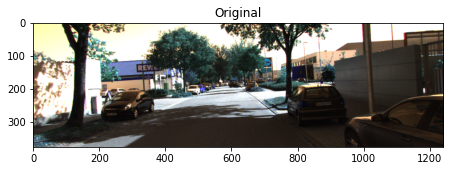

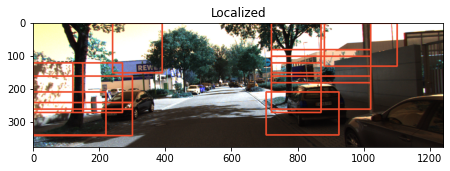

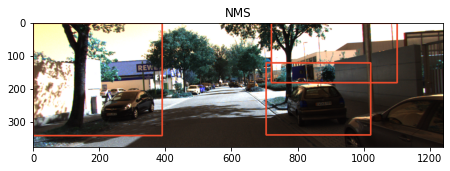

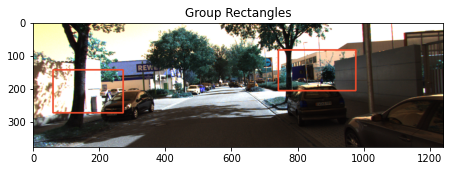

In [ ]:
test_localize(model_svm_02, img1_9)

PATCHES
Number of patches:  54


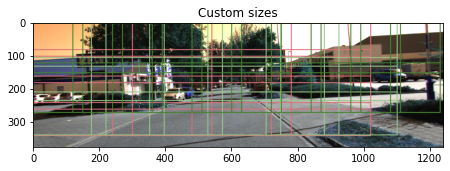

Patches detected:  [<__main__.Patch object at 0x7f9ccb28eb90>, <__main__.Patch object at 0x7f9ccaf7b8d0>, <__main__.Patch object at 0x7f9ccb247a10>, <__main__.Patch object at 0x7f9ccb247ed0>]
Group Rectangles:  ()


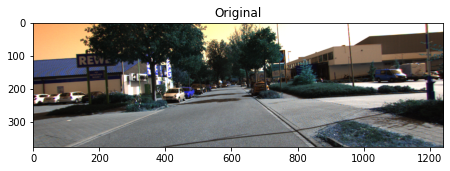

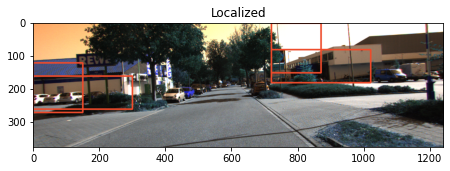

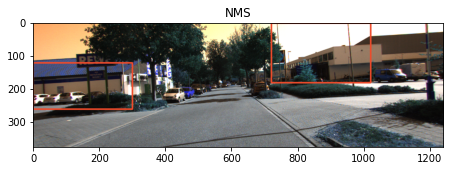

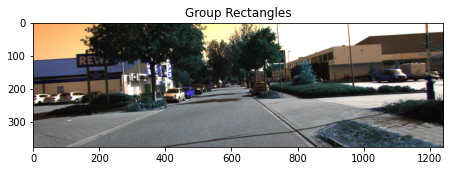

In [ ]:
test_localize(model_svm_02, img1_20)

PATCHES
Number of patches:  54


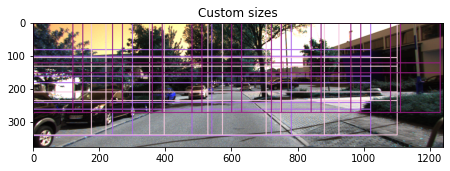

Patches detected:  [<__main__.Patch object at 0x7f9ccafe3650>, <__main__.Patch object at 0x7f9ccd242dd0>, <__main__.Patch object at 0x7f9ccaf7b8d0>, <__main__.Patch object at 0x7f9ccaf7bc90>, <__main__.Patch object at 0x7f9ccb0ae410>, <__main__.Patch object at 0x7f9ccb0ae190>]
Group Rectangles:  [[741  16 224 126]]


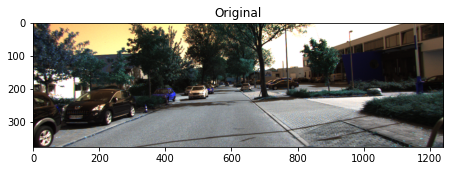

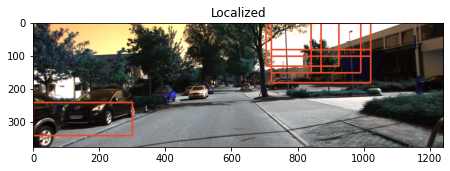

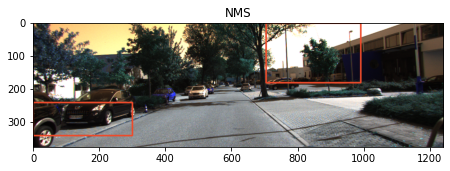

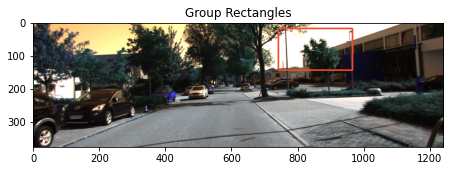

In [ ]:
test_localize(model_svm_02, img1_50)

##### Dataset: 0002

PATCHES
Number of patches:  54


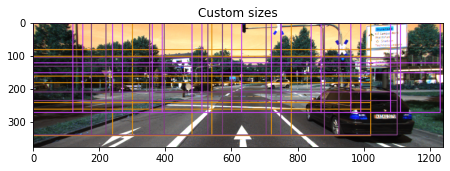

Patches detected:  [<__main__.Patch object at 0x7f9ccb330590>, <__main__.Patch object at 0x7f9ccb330510>]
Group Rectangles:  ()


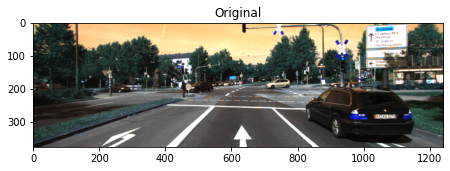

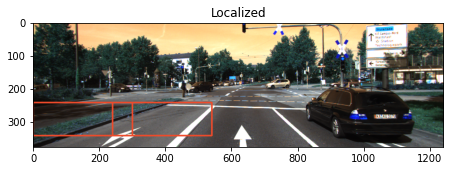

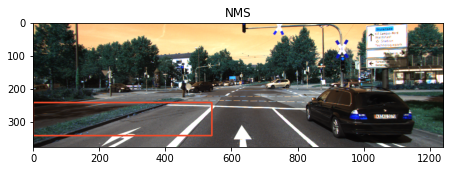

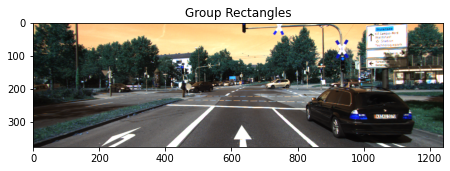

In [ ]:
test_localize(model_svm_01, img2_100)

PATCHES
Number of patches:  54


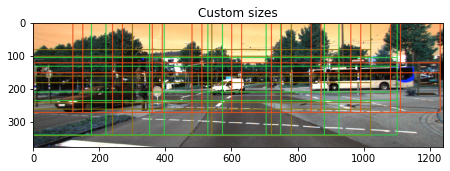

Patches detected:  [<__main__.Patch object at 0x7f9ccb3304d0>, <__main__.Patch object at 0x7f9ccb3bf710>, <__main__.Patch object at 0x7f9ccb370ad0>, <__main__.Patch object at 0x7f9ccb370c50>]
Group Rectangles:  [[900 120 150 150]]


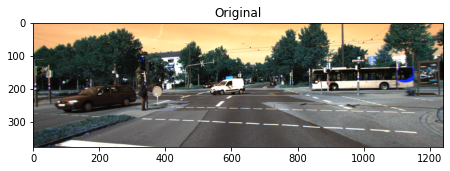

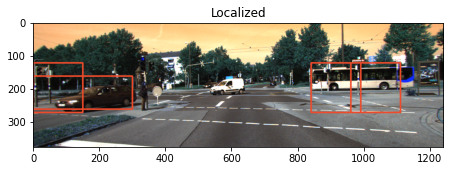

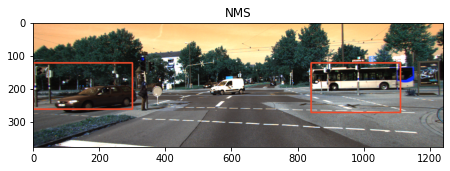

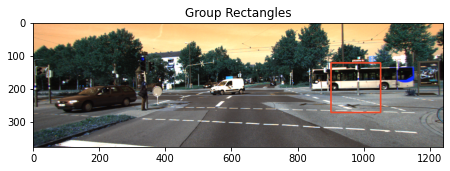

In [ ]:
test_localize(model_svm_01, img2_150)

PATCHES
Number of patches:  54


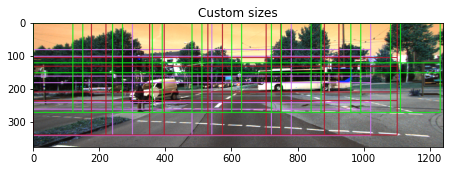

Patches detected:  [<__main__.Patch object at 0x7f9ccb3bf710>, <__main__.Patch object at 0x7f9ccb370ad0>, <__main__.Patch object at 0x7f9ccb36b2d0>]
Group Rectangles:  ()


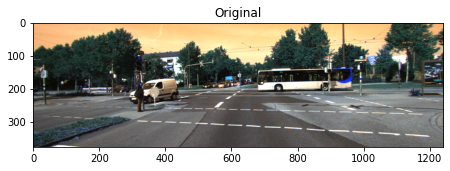

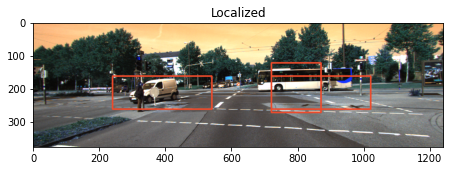

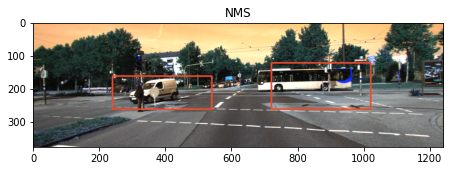

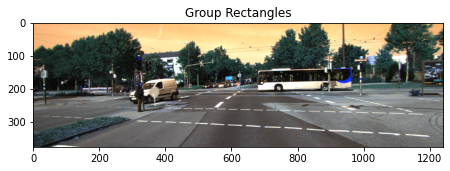

In [ ]:
test_localize(model_svm_01, img2_160)

##### Dataset: 0003

PATCHES
Number of patches:  54


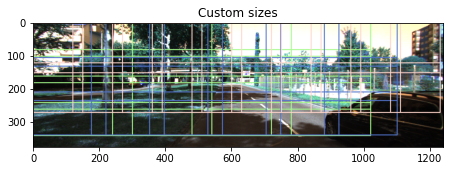

Patches detected:  [<__main__.Patch object at 0x7f9ccaf7b050>, <__main__.Patch object at 0x7f9ccaf7b290>]
Group Rectangles:  ()


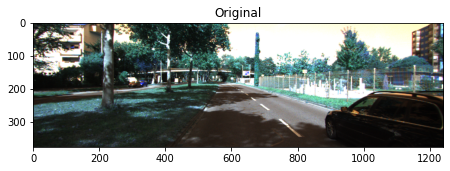

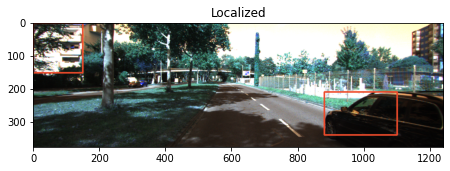

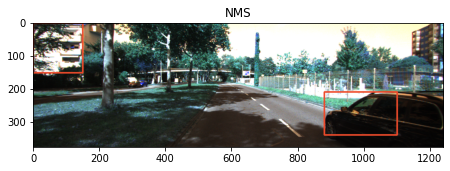

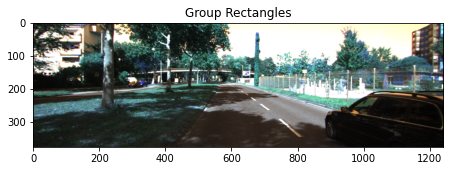

In [ ]:
test_localize(model_svm_01, img3_1)

PATCHES
Number of patches:  54


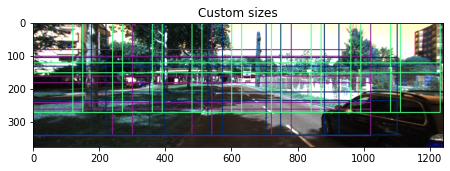

Patches detected:  [<__main__.Patch object at 0x7f9ccb1977d0>, <__main__.Patch object at 0x7f9ccb0aa210>, <__main__.Patch object at 0x7f9ccb0aa650>]
Group Rectangles:  [[  0   0 185 140]]


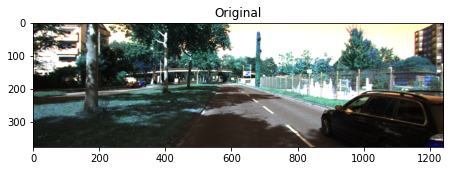

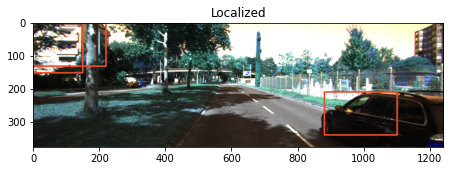

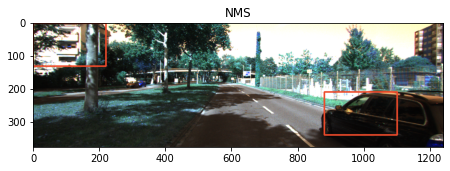

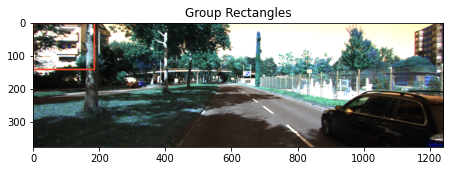

In [ ]:
test_localize(model_svm_01, img3_2)


PATCHES
Number of patches:  54


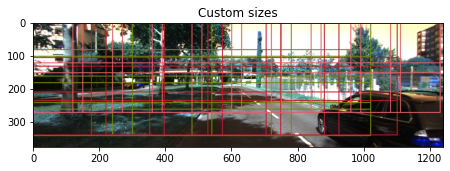

Patches detected:  [<__main__.Patch object at 0x7f9ccaf6b7d0>]
Group Rectangles:  ()


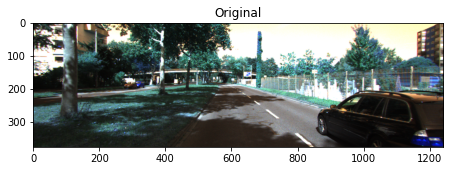

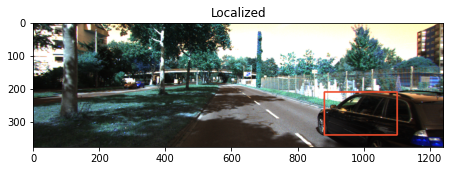

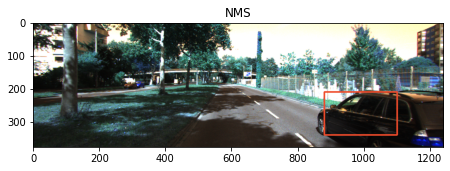

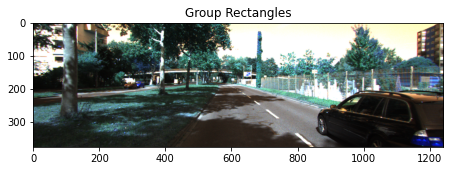

In [ ]:
test_localize(model_svm_01, img3_3)

## IoU Method

### Method

In [ ]:
IMG_WIDTH = 1242
IMG_HEIGHT = 375

In [ ]:
def getIOUFast(true_boxes, predicted_boxes):
  """
  This function will calculate the IOU for 1 image given
  the true bounding boxes and the predicted ones.

  The idea here is to create 2 numpy arrays of all zeroes. We will fill one 
  with 1s if a true bounding box is present, and another with 1s if a predicted
  bounding box is present in that location.

  We can use logical and / logical or of those two nympy arrays to get the
  IOU.
  """

  pred = np.zeros((IMG_HEIGHT, IMG_WIDTH))
  true = np.zeros((IMG_HEIGHT, IMG_WIDTH))

  for box in true_boxes:
    # true_box = [bounding_box_id, <bb_left>, <bb_top>, <bb_right>, <bb_bottom>]
    for i in range(int(box[1]), int(box[3])):
      for j in range(int(box[2]), int(box[4])):
        true[j][i] = 1

  #plt.imshow(true, cmap="gray")
  
  for predicted_box in predicted_boxes:
    # predicted_box = Patch
    for i in range(int(predicted_box.x), int(predicted_box.x + predicted_box.w)):
      for j in range(int(predicted_box.y), int(predicted_box.y + predicted_box.h)):
        pred[j][i] = 1
  
  #plt.imshow(pred, cmap="gray")
  log_and = np.logical_and(true, pred)
  log_or = np.logical_or(true, pred)

  if len(log_or[log_or == True]) == 0:
    # Means no true or predictd bounding box
    return true, pred, 1
    
  return true, pred, (len(log_and[log_and == True]) / len(log_or[log_or == True]))

def getAllIOU(all_true_boxes, all_predicted_boxes):
  """
  This function will calculate the IOU for each image given a 2 lists.
  The first contains ground truth labels for bounding boxes.
  The second contains predicted labels for bounding boxes.
  Note that they must be the same size, and in the same order.
  """
  
  iouCoeff = []

  for i in range(0, len(all_predicted_boxes)):
    _, _, coeff = getIOUFast(all_true_boxes[i], all_predicted_boxes[i])
    iouCoeff.append(coeff)

  return iouCoeff

## 3-fold Validation

In [ ]:
def parse(filepath):
  '''
      Parse gt.txt with format
        <frame>, <id>, <type>, <truncated>, <occluded>, <alpha>, <bb_left>, <bb_top>, <bb_right>, <bb_bottom>, <3D_H>, <3D_W>, <3D_L>, <x>, <y>, <z>, <ry>
      Return dict as:
        <type> = "Car", "Van", "Truck", "Pedastrian", "Person_sitting", "Cyclist", "Tram", "Misc", "DontCare"
        key: frame
        value: list - <id>, <bb_left>, <bb_top>, <bb_right>, <bb_bottom>
      Feel free to edit your structure as needed!
  '''

  used_type = ["Car", "Van", "Truck", "Tram"]

  lines = open(filepath, "r").readlines()                                 
  bbox = {}
       #  <frame>, <id>, <truncated>, <occluded>, <alpha>, <bb_left>, <bb_top>, <bb_right>, <bb_bottom>, <3D_H>, <3D_W>, <3D_L>, <x>,   <y>,   <z>,   <ry>
  mask = [False,   True,  False,       False,      False,   True,      True,     True,       True,        False,  False,  False,  False, False, False, False]
  
  for line in lines:
    l = line.strip().split(' ') #convert line to list
    typ = l.pop(2)  # get type of bbox 
    line = np.asarray(l).astype(np.float32) # convert into array 
    frame, line = int(line[0]), line[mask] # get frame number and mask the line   
    if frame not in bbox.keys():
      bbox[frame] = []   
    if typ in used_type:
        bbox[frame].append(line)
  return bbox

In [ ]:
bboxes0 = parse(path + "dataset_given/0000.txt")
bboxes1 = parse(path + "dataset_given/0001.txt")
bboxes2 = parse(path + "dataset_given/0002.txt")
bboxes3 = parse(path + "dataset_given/0003.txt")

In [ ]:
def getBoxes(path_to_folder, vehicle_classifier, nms=True):
  """
  Similarly to the parse function given, this function should
  return a dictionary where the keys in the dictionary are the image
  numbers of all images in ${path_to_folder}. The values will be list of Patches
  representing predicted bounding boxes.

  Parameters:
  ___________

  path_to_folder : String representing the path to the folder where images are
  vehicle_classifier : an sklearn trained classifier that can be used to predict
                      vehicle vs non vehicle in an image
  save_file : The file we will save this dictionary to (so we only need to run
              this function once)
  """
  bbox = {}
  i=0
  for f in os.listdir(path_to_folder):
    img = cv2.imread(os.path.join(path_to_folder, f))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    image_number = int(f[0:6])
    
    patches,img3 = sliding_window(img, non_intersected_percentage=.8, custom_patch_sizes=[[300,100],[220,130],[150,150]])
    # patches,img3 = sliding_window(img, non_intersected_percentage=0.85, custom_patch_sizes=[[100,100]])
    localized, localized_img = localize2(patches, img, vehicle_classifier)
    p = []
    if nms: 
      p, grouped = new_NMS(localized, img)
    else:
      boxes = []
      for i in localized:
        patch_cord = []
        patch_cord.append(i.x)
        patch_cord.append(i.y)
        patch_cord.append(i.w)
        patch_cord.append(i.h)
        boxes.append(patch_cord)
      box_grouped, _ = cv2.groupRectangles(boxes, 1, 1)
      copy = img.copy()
      for rectangle in box_grouped:
        rectangle_grouped_patch = Patch(rectangle[0],rectangle[1], rectangle[2], rectangle[3])
        p.append(rectangle_grouped_patch)

    bbox[image_number] = p
  
  return bbox

In [ ]:
model_path = path + "models/SVM_rbf_train01.pkl"
model_svm_01 =  pickle.load(open(model_path, 'rb'))

model_path = path + "models/SVM_rbf_train02.pkl"
model_svm_02 =  pickle.load(open(model_path, 'rb'))

model_path = path + "models/SVM_rbf_train12.pkl"
model_svm_12 =  pickle.load(open(model_path, 'rb'))

In [ ]:
# Our NMS - takes 30 minutes to run. 

ourboxes0 = getBoxes(path + "dataset_given/0000", model_svm_12)
ourboxes1 = getBoxes(path + "dataset_given/0001", model_svm_02)
ourboxes2 = getBoxes(path + "dataset_given/0002", model_svm_01)

In [ ]:
iouCoeff_0 = getAllIOU(bboxes0, ourboxes0)
iouCoeff_1 = getAllIOU(bboxes1, ourboxes1)
iouCoeff_2 = getAllIOU(bboxes2, ourboxes2)

print(sum(iouCoeff_0) / len(iouCoeff_0))
print(sum(iouCoeff_1) / len(iouCoeff_1))
print(sum(iouCoeff_2) / len(iouCoeff_2))

0.12663720767636247
0.2649323099383619
0.09962375658997058


In [ ]:
# OpenCV Group Rectangle

ourboxes0_cv2 = getBoxes(path + "dataset_given/0000", model_svm_12, False)
ourboxes1_cv2 = getBoxes(path + "dataset_given/0001", model_svm_02, False)
ourboxes2_cv2 = getBoxes(path + "dataset_given/0002", model_svm_01, False)

In [ ]:
iouCoeff_0 = getAllIOU(bboxes0, ourboxes0_cv2)
iouCoeff_1 = getAllIOU(bboxes1, ourboxes1_cv2)
iouCoeff_2 = getAllIOU(bboxes2, ourboxes2_cv2)

print(sum(iouCoeff_0) / len(iouCoeff_0))
print(sum(iouCoeff_1) / len(iouCoeff_1))
print(sum(iouCoeff_2) / len(iouCoeff_2))

0.08673712487671537
0.16007831603583703
0.09845126087283944


## Examples

In [ ]:
def see_detected_boxes(dictionary_of_boxes, dictionary_of_true_boxes, dataset_path, number_of_images, start_at=0):

  for i in range(start_at, start_at + number_of_images):

    img = cv2.imread(os.path.join(dataset_path + str(i).zfill(6) + '.png'))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img2 = img.copy()

    for patch in dictionary_of_boxes[i]:
      color = [255,0,0]
      cv2.rectangle(img, (patch.x,patch.y), (patch.x + patch.w, patch.y+patch.h), color, 5)

    for patch in dictionary_of_true_boxes[i]:
      color = [255,0,0]
      cv2.rectangle(img2, (patch[1],patch[2]), (patch[3], patch[4]), color, 5)

    plt.figure(figsize=(25,25))
    plt.subplot(131), plt.imshow(img)
    plt.title("Predicted: " + str(len(dictionary_of_boxes[i])))
    plt.xticks([])
    plt.yticks([])
    
    plt.subplot(132), plt.imshow(img2)
    plt.title("True: " + str(len(dictionary_of_true_boxes[i])))
    plt.xticks([])
    plt.yticks([])
    plt.show()

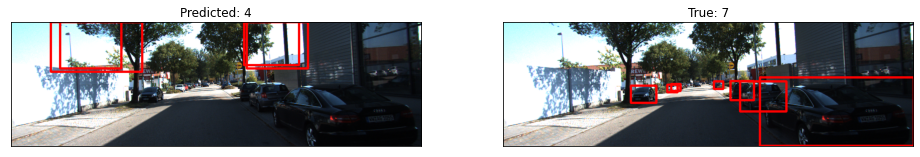

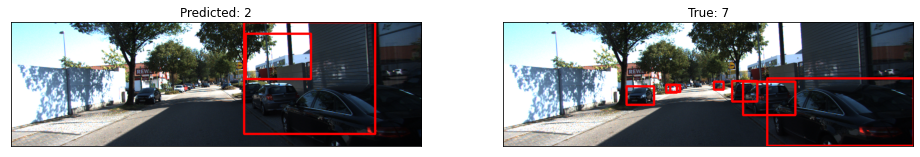

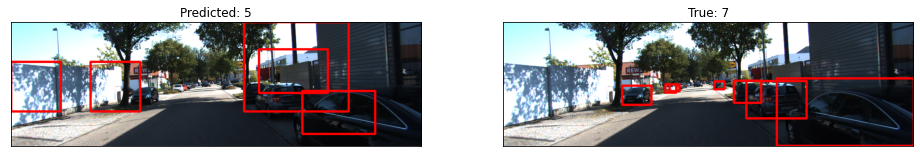

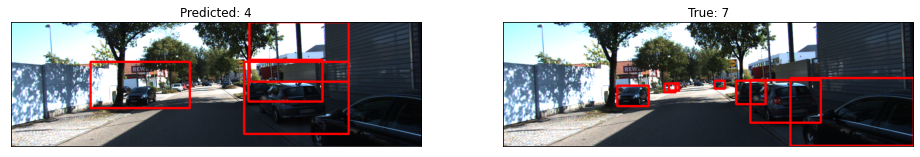

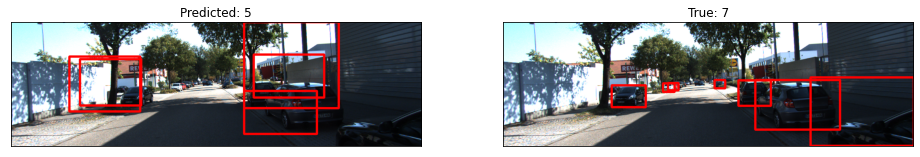

In [ ]:
see_detected_boxes(ourboxes1, bboxes1, os.path.join(path + "dataset_given/0001/"), 5)

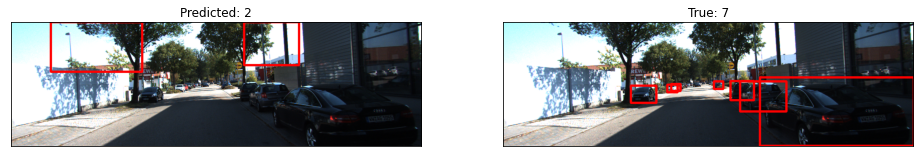

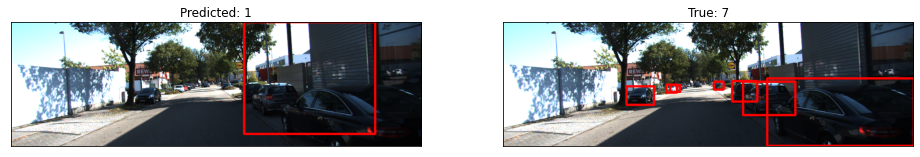

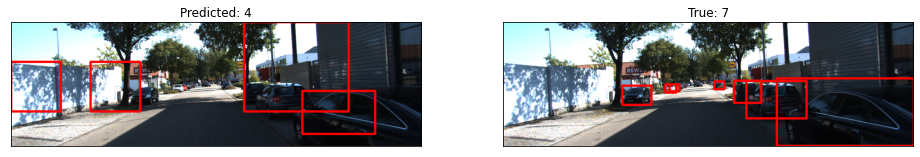

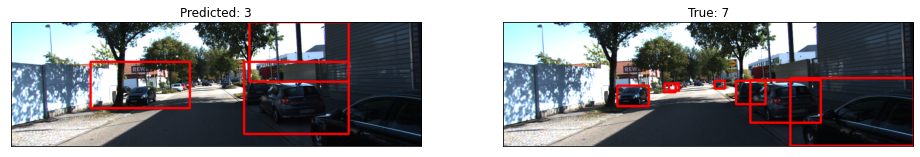

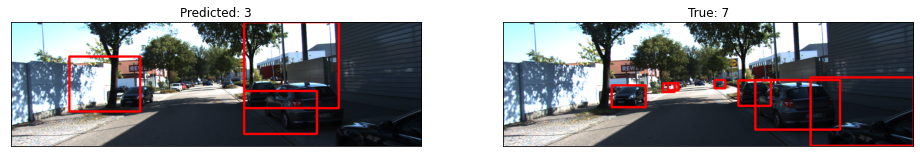

In [ ]:
see_detected_boxes(ourboxes1_cv2, bboxes1, os.path.join(path + "dataset_given/0001/"), 5)

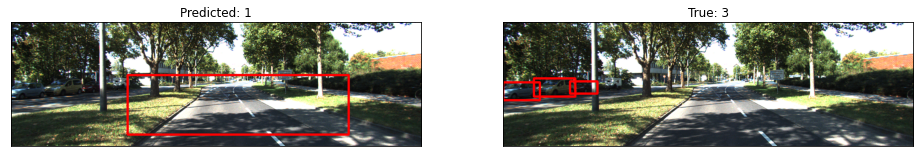

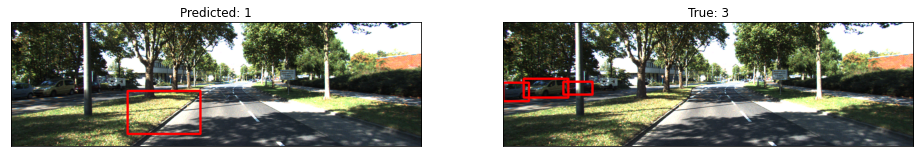

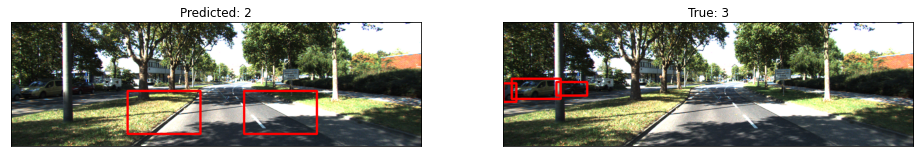

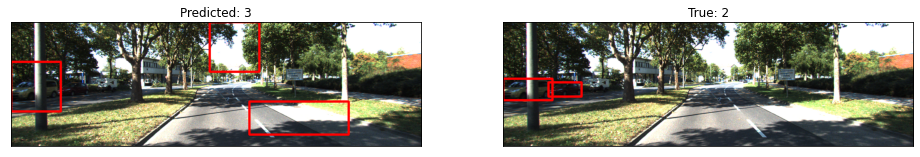

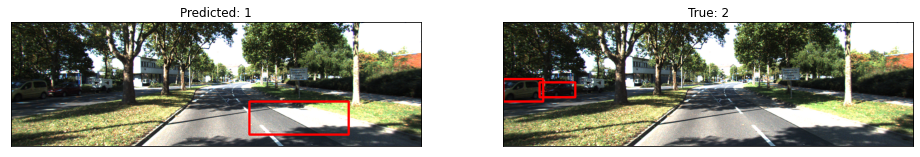

In [ ]:
see_detected_boxes(ourboxes2, bboxes2, os.path.join(path + "dataset_given/0002/"), 5)

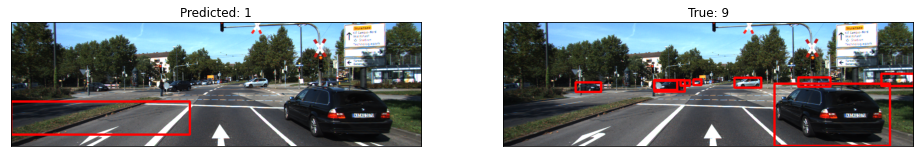

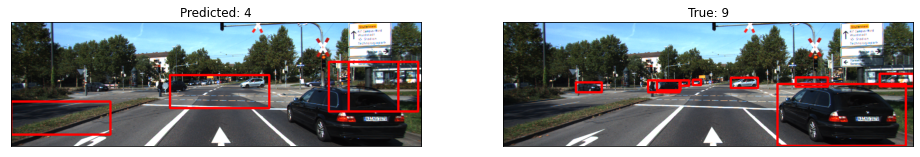

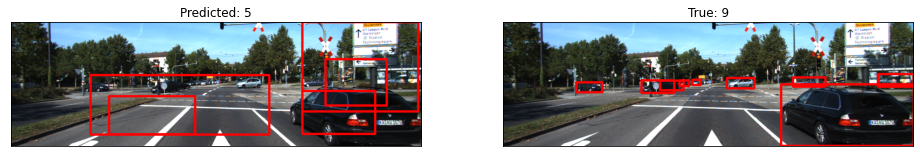

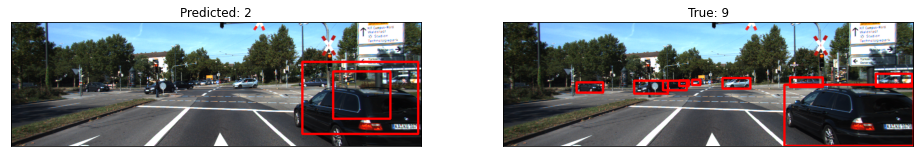

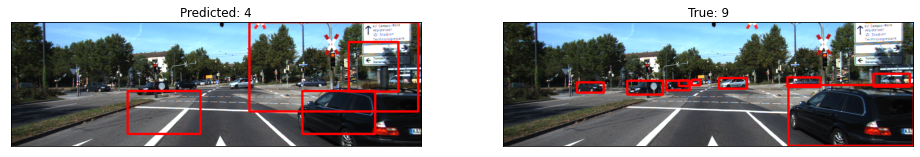

In [ ]:
see_detected_boxes(ourboxes2, bboxes2, os.path.join(path + "dataset_given/0002/"), 5, start_at=100)

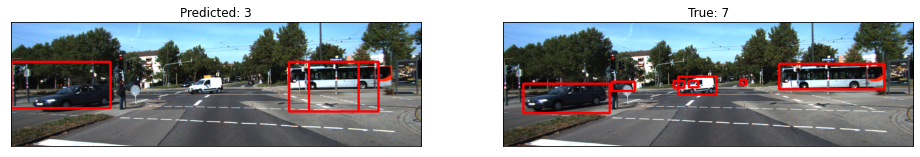

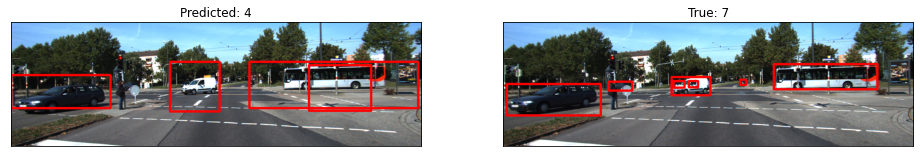

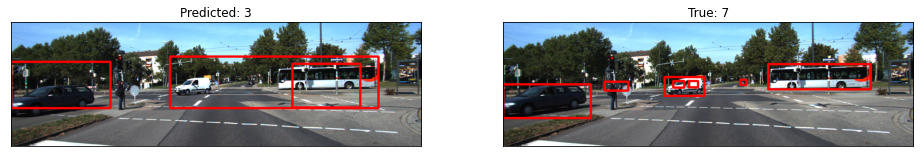

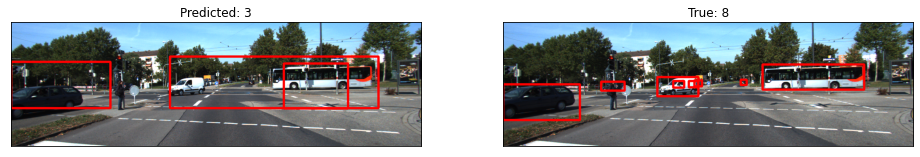

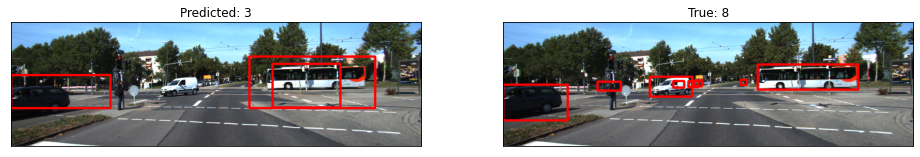

In [ ]:
see_detected_boxes(ourboxes2, bboxes2, os.path.join(path + "dataset_given/0002/"), 5, start_at=150)